In [26]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import copy

manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [0]:
dataroot = "./data"
workers = 2
batch_size = 64
image_size = 32
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

num_epochs = 350
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

ngpu = 1

In [3]:
dataset = dset.CIFAR10(
    root=dataroot,
    download=True,
    transform=transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])
)

0it [00:00, ?it/s]

170500096it [00:06, 25222746.60it/s]                               


Extracting ./data/cifar-10-python.tar.gz to ./data


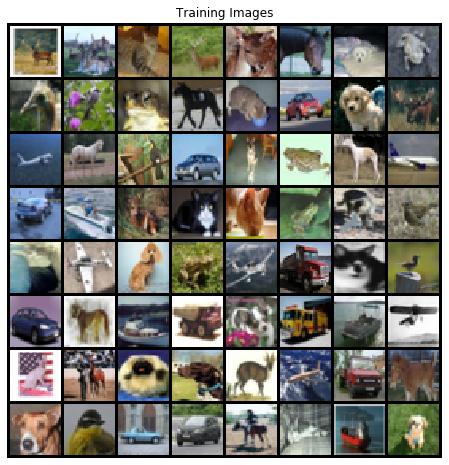

In [4]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [0]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf, nc, kernel_size=1, stride=1, padding=0, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [6]:
netG = Generator(ngpu).to(device)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
# Input shape for the DCGAN generator is the variable of shape (1, 100, 1, 1, ).
# Lets check that GAN generates image with correct shape (1, 3, 32, 32)

input_variable = torch.randn((1, 100, 1, 1, )).to(device)
netG(input_variable).shape

torch.Size([1, 3, 32, 32])

In [0]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 8, 1, 2, 2, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
netD = Discriminator(ngpu).to(device)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(2, 2), stride=(2, 2), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
# Discriminator is the model that should predict single number from input image.
# This number is the probability of input being fake. 
# Lets check that Discriminator will return single number from input of size (1, 3, 32, 32)

input_variable = torch.randn((1, 3, 32, 32, )).to(device)
netD(input_variable)

tensor([[[[0.4132]]]], device='cuda:0', grad_fn=<SigmoidBackward>)

In [0]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            new_img = vutils.make_grid(fake, padding=2, normalize=True)
            img_save_name = 'CIFAR_fake_images_'+str(len(img_list))+'.pt'
            path_img = F"/content/gdrive/My Drive/{img_save_name}" 
            torch.save(new_img, path_img)
            img_list.append(new_img)
        iters += 1
    
    if (epoch+1) % 10 == 0:
        netG_save_name = 'CIFAR_epoch_'+str(epoch)+'_generator.pt'
        netD_save_name = 'CIFAR_epoch_'+str(epoch)+'_discriminator.pt'
        path_G = F"/content/gdrive/My Drive/{netG_save_name}" 
        path_D = F"/content/gdrive/My Drive/{netD_save_name}"
        torch.save(copy.deepcopy(netG.state_dict()), path_G)
        torch.save(copy.deepcopy(netD.state_dict()), path_D)


Starting Training Loop...
[1/350][0/782]	Loss_D: 1.4164	Loss_G: 2.4172	D(x): 0.4712	D(G(z)): 0.4722 / 0.0918
[1/350][500/782]	Loss_D: 1.4216	Loss_G: 2.4557	D(x): 0.7332	D(G(z)): 0.5966 / 0.1234
[2/350][0/782]	Loss_D: 0.9808	Loss_G: 3.1965	D(x): 0.8740	D(G(z)): 0.5012 / 0.0501
[2/350][500/782]	Loss_D: 1.8921	Loss_G: 3.7125	D(x): 0.9476	D(G(z)): 0.8029 / 0.0328
[3/350][0/782]	Loss_D: 2.9006	Loss_G: 1.1569	D(x): 0.9847	D(G(z)): 0.9271 / 0.3493
[3/350][500/782]	Loss_D: 0.5228	Loss_G: 2.3138	D(x): 0.6873	D(G(z)): 0.1058 / 0.1145
[4/350][0/782]	Loss_D: 0.7523	Loss_G: 3.1345	D(x): 0.7134	D(G(z)): 0.3119 / 0.0507
[4/350][500/782]	Loss_D: 0.4334	Loss_G: 3.9780	D(x): 0.8941	D(G(z)): 0.2610 / 0.0223
[5/350][0/782]	Loss_D: 0.5604	Loss_G: 2.4184	D(x): 0.8287	D(G(z)): 0.2948 / 0.0985
[5/350][500/782]	Loss_D: 1.0656	Loss_G: 1.7873	D(x): 0.7112	D(G(z)): 0.4731 / 0.1858
[6/350][0/782]	Loss_D: 1.1122	Loss_G: 1.7387	D(x): 0.4265	D(G(z)): 0.1524 / 0.1954
[6/350][500/782]	Loss_D: 1.0895	Loss_G: 3.4953	D(x)

Wonderful Google Colab lost all my previous calculations:(  But Google Drive saved something:)

In [0]:
netG.load_state_dict(torch.load(F"/content/gdrive/My Drive/CIFAR_epoch_109_generator.pt"))
netD.load_state_dict(torch.load(F"/content/gdrive/My Drive/CIFAR_epoch_109_discriminator.pt"))

<All keys matched successfully>

In [0]:
img_list = []
for i in range(184):
    im_title = 'CIFAR_fake_images_'+str(i)+'.pt'
    im_path = F"/content/gdrive/My Drive/{im_title}" 
    im = torch.load(im_path)
    img_list.append(im)

In [0]:
# losses for epochs 1-109 were lost:(
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

for epoch in range(110, num_epochs):
    for i, data in enumerate(dataloader, 0):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 500 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            new_img = vutils.make_grid(fake, padding=2, normalize=True)
            img_save_name = 'CIFAR_fake_images_'+str(len(img_list))+'.png'
            path_img = F"/content/gdrive/My Drive/{img_save_name}" 
            torch.save(new_img, path_img)
            img_list.append(new_img)
        iters += 1
    
    if (epoch+1) % 10 == 0:
        netG_save_name = 'CIFAR_epoch_'+str(epoch)+'_generator.pt'
        netD_save_name = 'CIFAR_epoch_'+str(epoch)+'_discriminator.pt'
        path_G = F"/content/gdrive/My Drive/{netG_save_name}" 
        path_D = F"/content/gdrive/My Drive/{netD_save_name}"
        torch.save(copy.deepcopy(netG.state_dict()), path_G)
        torch.save(copy.deepcopy(netD.state_dict()), path_D)


Starting Training Loop...
[111/350][0/782]	Loss_D: 0.0423	Loss_G: 10.9490	D(x): 0.9938	D(G(z)): 0.0341 / 0.0000
[111/350][500/782]	Loss_D: 0.1070	Loss_G: 6.6100	D(x): 0.9378	D(G(z)): 0.0082 / 0.0090
[112/350][0/782]	Loss_D: 0.2944	Loss_G: 6.6749	D(x): 0.9970	D(G(z)): 0.2025 / 0.0030
[112/350][500/782]	Loss_D: 0.0184	Loss_G: 6.7345	D(x): 0.9864	D(G(z)): 0.0043 / 0.0043
[113/350][0/782]	Loss_D: 0.3685	Loss_G: 9.7167	D(x): 0.9984	D(G(z)): 0.2273 / 0.0002
[113/350][500/782]	Loss_D: 0.0216	Loss_G: 6.0350	D(x): 0.9866	D(G(z)): 0.0077 / 0.0071
[114/350][0/782]	Loss_D: 0.0319	Loss_G: 5.6162	D(x): 0.9939	D(G(z)): 0.0234 / 0.0101
[114/350][500/782]	Loss_D: 0.0129	Loss_G: 7.2554	D(x): 0.9935	D(G(z)): 0.0060 / 0.0033
[115/350][0/782]	Loss_D: 0.0063	Loss_G: 6.8258	D(x): 0.9994	D(G(z)): 0.0056 / 0.0039
[115/350][500/782]	Loss_D: 0.2352	Loss_G: 4.5342	D(x): 0.8809	D(G(z)): 0.0213 / 0.0550
[116/350][0/782]	Loss_D: 0.0174	Loss_G: 6.2859	D(x): 0.9985	D(G(z)): 0.0149 / 0.0111
[116/350][500/782]	Loss_D: 0

In [0]:
print(len(img_list))

561


/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


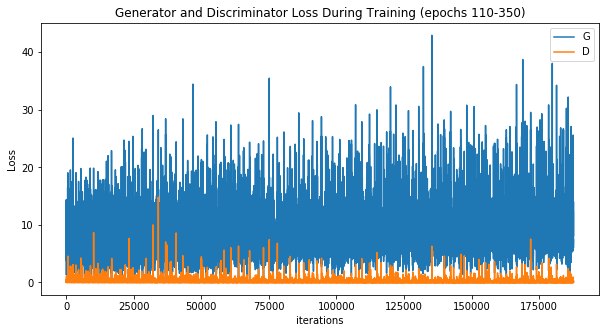

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training (epochs 110-350)")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [0]:
# if something happens to Colab, load images from Google Drive... And it did happen!
img_list = []
for i in range(1, 184):
    image_name = "CIFAR_fake_images_"+str(i)+".pt"          # it was a mistake to save images as *.pt, but I'm too lazy to correct that))
    im = torch.load(F"/content/gdrive/My Drive/{image_name}")
    img_list.append(im)

for i in range(184, 561):
    image_name = "CIFAR_fake_images_"+str(i)+".png"
    im = torch.load(F"/content/gdrive/My Drive/{image_name}")
    img_list.append(im)

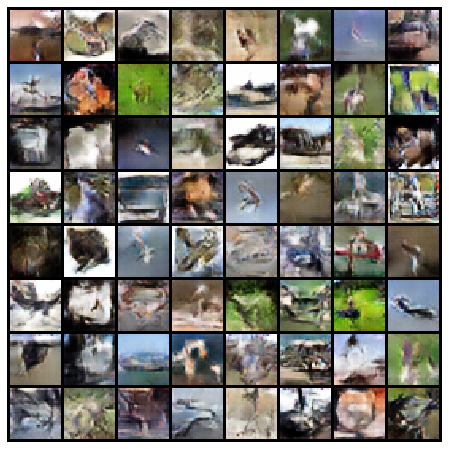

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[:20]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

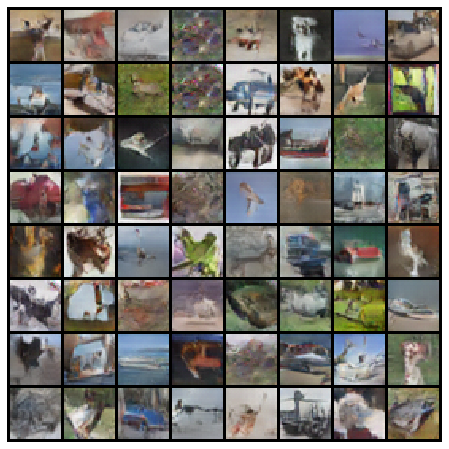

In [16]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[len(img_list)-20:]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

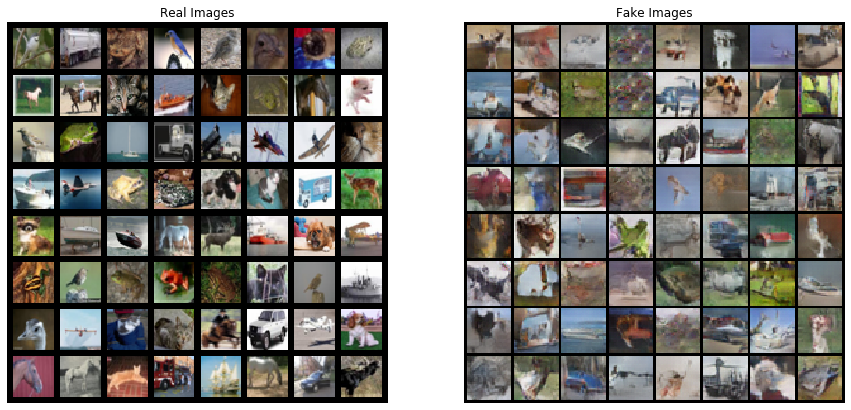

In [18]:
real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()


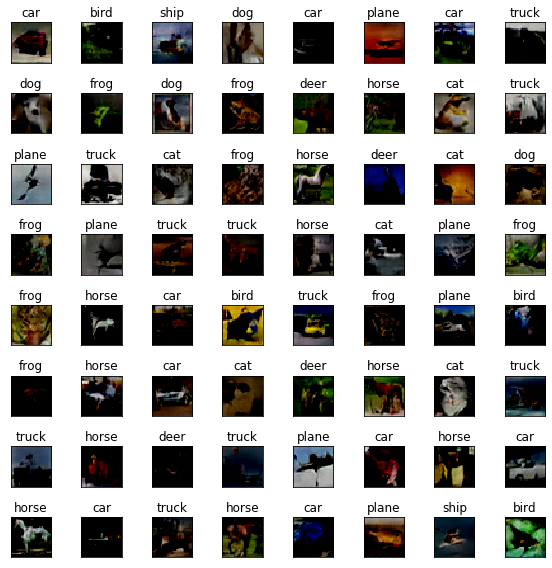

In [44]:
netG.load_state_dict(torch.load(F"/content/gdrive/My Drive/CIFAR_epoch_299_generator.pt"))

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 12, 2)
        self.bnm1 = nn.BatchNorm2d(12)
        self.conv2 = nn.Conv2d(12, 48, 2)
        self.bnm2 = nn.BatchNorm2d(48)
        self.conv3 = nn.Conv2d(48, 192, 3)
        self.bnm3 = nn.BatchNorm2d(192)
        self.conv4 = nn.Conv2d(192, 768, 2)
        self.bnm4 = nn.BatchNorm2d(768)
        self.conv5 = nn.Conv2d(768, 3072, 3)
        self.bnm5 = nn.BatchNorm2d(3072)
        self.fc1 = nn.Linear(4*3072, 480)
        self.fc2 = nn.Linear(480, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.bnm1(x)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = self.bnm2(x)
        x = F.relu(self.conv3(x))
        x = self.bnm3(x)
        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x, 2, 2)
        x = self.bnm4(x)
        x = F.relu(self.conv5(x))
        x = self.bnm5(x)
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*3072)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

model = Net().to(device)
mm = torch.load(F"/content/gdrive/My Drive/90.5CIFAR_cnn.pt")
import re
new_mm = {}
for key in mm.keys():
    words = re.split("\.", key)[1:]
    new_key = '.'.join(words)
    new_mm[new_key] = mm[key]

model.load_state_dict(new_mm)

with torch.no_grad():
    noise = torch.randn(batch_size, nz, 1, 1, device=device)
    fake = netG(noise)
    predictions = model(fake).cpu().max(1)[1]

cnt = 0
plt.figure(figsize=(8, 8))
for i in range(8):
    for j in range(8):
        cnt += 1
        plt.subplot(8, 8, cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        prediction = predictions[cnt-1]
        fake_image = torch.clamp(fake[cnt-1], 0, 1)
        fake_image = fake_image.cpu()
        #print(fake_image)
        plt.title(classes[prediction.item()])
        plt.imshow(np.transpose(fake_image, (1, 2, 0)))
        
        
plt.tight_layout()
plt.show()

## see what my model thinks the fake images are